### **Semantic Segmentation using Cityscapes Data**

**What is Semantic Segmentation?:** Image Segmentation or Semantic Image Segmentation is a computer vision task in which we label specific regions of an image according to what's being shown. In the image segmentation task, the model partitions the image into different segments, each of them representing a different entity. Hence, segmentating image in different parts which shows a semantic partition of the image.

**Applications:** Image segmentation is useful in many fields from *self-driving cars, satellites, medical imaging*. The subtleties in medical imaging are quite complex and sometimes even challenging for trained physicians. A machine that can understand these nuances and can identify the necessary areas can make a profound impact in medical care.

**Dataset:** For our project, we will be using [cityscapes dataset](https://www.cityscapes-dataset.com/) which consists of diverse urban street scenes across 50 different cities at varying times of the year with dense pixel level annotations that allow us to build a semantic segmentation model. We have 5000 images at 1024x2048 resolution pre-split into train, validation, and test set and labeled annotations that span across 30+ classes and 8 categories that are commonly encountered during driving scene perception.

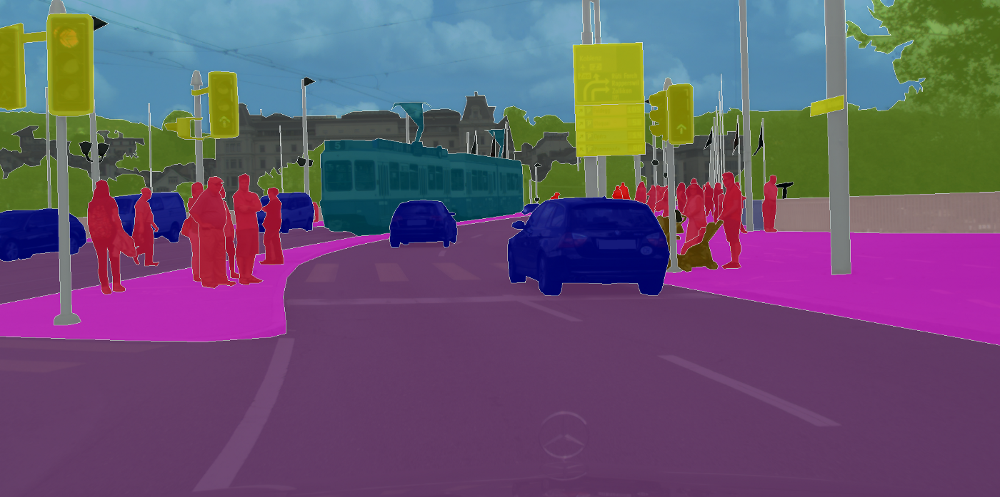

In [ ]:
from os.path import join, isdir
from os import listdir, rmdir
from shutil import move, rmtree, make_archive

import os
import cv2
import glob
import pickle
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans

from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential, Model, load_model
from keras.layers import Dense, Input, Dropout, Activation, Flatten, BatchNormalization, ReLU, LeakyReLU, concatenate
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, AveragePooling2D, GlobalAveragePooling2D, Add

from google.colab import drive
drive.mount('/gdrive')
drive_root = '/gdrive/My Drive/Fall2020/ADL_Final/'

COLAB_DIR = '/content/'
GT_DIR = COLAB_DIR + 'gtFine/gtFine/'
IMG_DIR = COLAB_DIR + 'leftImg/leftImg8bit/'

Mounted at /gdrive


### **1. Ingest**

*utility code to download cityscapes data - original and annotated images, preprocess them and store as an archive.*

#### Download Cityscapes

In [ ]:
# !pip install cityscapesscripts
from cityscapesscripts.download import downloader

# registration on https://www.cityscapes-dataset.com/
session = downloader.login()
downloader.get_available_packages(session=session)

# data for semantic segmentation task
print('Downloading gtFine and leftImg8bit packages ...\n')
package_list =['gtFine_trainvaltest.zip', 'leftImg8bit_trainvaltest.zip']
downloader.download_packages(session=session, package_names=package_list, destination_path=COLAB_DIR)

In [ ]:
!unzip -q gtFine_trainvaltest.zip -d gtFine
!unzip -q leftImg8bit_trainvaltest.zip -d leftImg

#### Preprocess & Archive

In [ ]:
# collapse child directories
for parent in listdir(GT_DIR):
    parent_dir = GT_DIR + parent
    for child in listdir(parent_dir):
        if isdir(join(parent_dir, child)):
            keep = glob.glob(join(parent_dir, child) + '/*_gtFine_color.png')
            keep = [f.split('/')[-1] for f in keep]
            for filename in list(set(listdir(join(parent_dir, child))) & set(keep)):
                move(join(parent_dir, child, filename), join(parent_dir, filename))
            rmtree(join(parent_dir, child))

for parent in listdir(IMG_DIR):
    parent_dir = IMG_DIR + parent
    for child in listdir(parent_dir):
        if isdir(join(parent_dir, child)):
            for filename in listdir(join(parent_dir, child)):
                move(join(parent_dir, child, filename), join(parent_dir, filename))
            rmtree(join(parent_dir, child))

In [ ]:
# process anr archive image in smaller size
IMG_SHAPE = 299, 299

gt_train_paths = [GT_DIR+'train/' + path for path in listdir(GT_DIR+'train/')]
gt_test_paths = [GT_DIR+'test/' + path for path in listdir(GT_DIR+'test/')]
gt_val_paths = [GT_DIR+'val/' + path for path in listdir(GT_DIR+'val/')]
gt_paths = gt_train_paths + gt_test_paths + gt_val_paths

im_train_paths = [IMG_DIR+'train/' + path for path in listdir(IMG_DIR+'train/')]
im_test_paths = [IMG_DIR+'test/' + path for path in listdir(IMG_DIR+'test/')]
im_val_paths = [IMG_DIR+'val/' + path for path in listdir(IMG_DIR+'val/')]
im_paths = im_train_paths + im_test_paths + im_val_paths

def resize_image(path):
    img = Image.open(path)
    img.thumbnail(IMG_SHAPE)
    out_file = join(path)
    img.save(out_file, 'PNG')

for img in gt_paths + im_paths:
    resize_image(img)

make_archive('gtFine', 'zip', GT_DIR)
make_archive('leftImg', 'zip', IMG_DIR)

### **2. Transform**

*utility code to fetch archived data, normalize image pixels, convert them into tf.Dataset objects and visualize them.*

#### Load Archive Data

In [1]:
def download_if_missing(url, target, extract=True):
    if os.path.exists(target):
        return target
    return tf.keras.utils.get_file(target, origin=url, extract=extract)

gt_url_file = 'https://storage.googleapis.com/mcg2208/gtFine.zip'
im_url_file = 'https://storage.googleapis.com/mcg2208/leftImg.zip'

gt_file, gt_dir = join(COLAB_DIR + 'gtFine.zip'), join(COLAB_DIR + 'gtFine/')
im_file, im_dir = join(COLAB_DIR + 'leftImg.zip'), join(COLAB_DIR + 'leftImg/')

download_if_missing(gt_url_file, gt_file, extract=False)
download_if_missing(im_url_file, im_file, extract=False)

!unzip -q $gt_file -d $gt_dir
!unzip -q $im_file -d $im_dir

NameError: name 'join' is not defined

#### Create TF Objects

In [ ]:
# normalize image pixels
IMG_SIZE = 299
BATCH_SIZE = 32
AUTOTUNE = tf.data.experimental.AUTOTUNE

GT_DIR = COLAB_DIR + 'gtFine/'
IMG_DIR = COLAB_DIR + 'leftImg/'

def load_and_preprocess_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img /= 255.0
    return img

def get_image_paths(dir):
    return sorted([dir + path for path in listdir(dir)])

# create tf.Dataset objects
gt_train_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(GT_DIR+'train/'))
gt_val_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(GT_DIR+'val/'))
gt_test_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(GT_DIR+'test/'))

gt_train_ds = gt_train_ds.map(load_and_preprocess_image)
gt_val_ds = gt_val_ds.map(load_and_preprocess_image)
gt_test_ds = gt_test_ds.map(load_and_preprocess_image)

im_train_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(IMG_DIR+'train/'))
im_val_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(IMG_DIR+'val/'))
im_test_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(IMG_DIR+'test/'))

im_train_ds = im_train_ds.map(load_and_preprocess_image)
im_val_ds = im_val_ds.map(load_and_preprocess_image)
im_test_ds = im_test_ds.map(load_and_preprocess_image)

#### Visualize Data

In [ ]:
def visualize_images(img, gt, pred):
    if pred is not None:
        fig, axes = plt.subplots(1, 3, figsize=(12, 8))
    else:
        fig, axes = plt.subplots(1, 2, figsize=(8, 8))

    axes[0].imshow(img)
    axes[0].set_title('Actual Image')

    axes[1].imshow(gt)
    axes[1].set_title('Masked Image')
    
    if pred is not None:
        axes[2].imshow(pred)
        axes[2].set_title('Predicted Image')

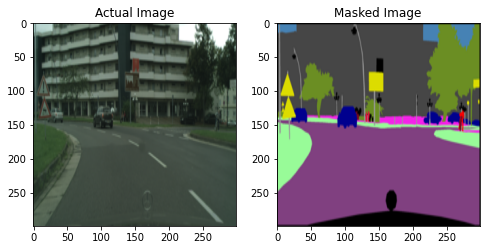

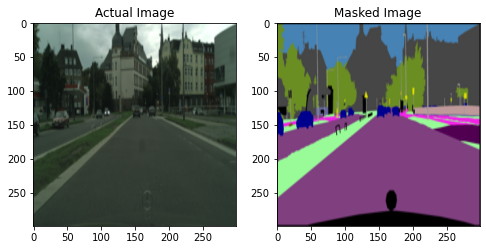

In [ ]:
for img, gt in list(zip(im_train_ds.take(2), gt_train_ds.take(2))):
    visualize_images(img, gt, None)

### **3. Model**

*code for model training, evaluation and prediction using PSPNet and U-Net with K-Means architecture.*

#### **Paramid Scheme Parsing Network**

PSPNet, or Pyramid Scene Parsing Network, is a semantic segmentation model that utilises a pyramid parsing module that exploits global context information by different-region based context aggregation. The local and global clues together make the final prediction more reliable. 

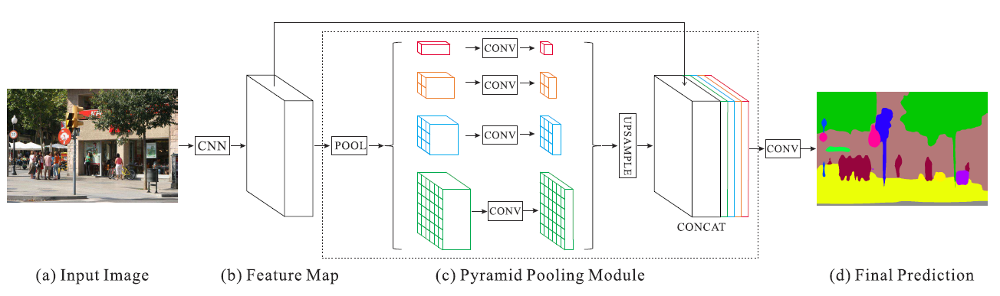

##### Model Definition

**Feature Maps:** Takes input image and constructs feature maps for image. Feature maps are extracted by feeding image using transfer learning or scratch network with dilated convolutions. As large size kernels extracts more useful information than small size kernel but computation cost is higher, dilated convolutions gathers large size area information with small size kernel for higher `dilation_rates` to keep dimensions same as input Image. Generally residual blocks with dilations are used to construct feature maps. No. of feature maps `N` is a hyperparameter and needs to be tuned for good result.

**Pyramid Pooling Module:** An image contains objects of sizes ranging from small to large area in different regions. Fully Convolution Network (FCN), U-Net and other networks constructs feature maps by upsampling and doing segmentation at different levels for segmentation of all objects in all regions. But in PSPNet to correctly segment all size objects, feature maps are average pooled at different pool size. The output of Pyramid Pooling Module is concatenation of base feature maps and upsampled average pooled feature maps.


In [ ]:
def conv_block(X,filters,block):
    # resiudal block with dilated convolutions
    # add skip connection at last after doing convoluion

    b = 'block_'+str(block)+'_'
    f1,f2,f3 = filters
    X_skip = X

    # block_a
    X = Conv2D(filters=f1,kernel_size=(1,1),dilation_rate=(1,1),
               padding='same',kernel_initializer='he_normal',name=b+'a')(X)
    X = BatchNormalization(name=b+'batch_norm_a')(X)
    X = LeakyReLU(alpha=0.2,name=b+'leakyrelu_a')(X)
    # block_b
    X = Conv2D(filters=f2,kernel_size=(3,3),dilation_rate=(2,2),
               padding='same',kernel_initializer='he_normal',name=b+'b')(X)
    X = BatchNormalization(name=b+'batch_norm_b')(X)
    X = LeakyReLU(alpha=0.2,name=b+'leakyrelu_b')(X)
    # block_c
    X = Conv2D(filters=f3,kernel_size=(1,1),dilation_rate=(1,1),
               padding='same',kernel_initializer='he_normal',name=b+'c')(X)
    X = BatchNormalization(name=b+'batch_norm_c')(X)
    # skip_conv
    X_skip = Conv2D(filters=f3,kernel_size=(3,3),padding='same',name=b+'skip_conv')(X_skip)
    X_skip = BatchNormalization(name=b+'batch_norm_skip_conv')(X_skip)
    # block_c + skip_conv
    X = Add(name=b+'add')([X,X_skip])
    X = ReLU(name=b+'relu')(X)
    return X
    
def base_feature_maps(input_layer):
    # base covolution module to get input image feature maps 
    
    # block_1
    base = conv_block(input_layer,[16,16,32],'1')
    # block_2
    base = conv_block(base,[16,16,32],'2')
    return base

def pyramid_feature_maps(input_layer):
    # pyramid pooling module
    
    base = base_feature_maps(input_layer)
    # red
    red = GlobalAveragePooling2D(name='red_pool')(base)
    red = tf.keras.layers.Reshape((1,1,32))(red)
    red = Conv2D(filters=32,kernel_size=(1,1),name='red_1_by_1')(red)
    red = UpSampling2D(size=128,interpolation='bilinear',name='red_upsampling')(red)
    red = tf.image.resize(red, [IMG_SIZE, IMG_SIZE])
    # yellow
    yellow = AveragePooling2D(pool_size=(2,2),name='yellow_pool')(base)
    yellow = Conv2D(filters=32,kernel_size=(1,1),name='yellow_1_by_1')(yellow)
    yellow = UpSampling2D(size=2,interpolation='bilinear',name='yellow_upsampling')(yellow)
    yellow = tf.image.resize(yellow, [IMG_SIZE, IMG_SIZE])
    # blue
    blue = AveragePooling2D(pool_size=(4,4),name='blue_pool')(base)
    blue = Conv2D(filters=32,kernel_size=(1,1),name='blue_1_by_1')(blue)
    blue = UpSampling2D(size=4,interpolation='bilinear',name='blue_upsampling')(blue)
    blue = tf.image.resize(blue, [IMG_SIZE, IMG_SIZE])
    # green
    green = AveragePooling2D(pool_size=(8,8),name='green_pool')(base)
    green = Conv2D(filters=32,kernel_size=(1,1),name='green_1_by_1')(green)
    green = UpSampling2D(size=8,interpolation='bilinear',name='green_upsampling')(green)
    green = tf.image.resize(green, [IMG_SIZE, IMG_SIZE])
    # base + red + yellow + blue + green
    return tf.keras.layers.concatenate([base,red,yellow,blue,green])

def last_conv_module(input_layer):
    X = pyramid_feature_maps(input_layer)
    X = Conv2D(filters=3,kernel_size=3,padding='same',name='last_conv_3_by_3')(X)
    X = BatchNormalization(name='last_conv_3_by_3_batch_norm')(X)
    X = Activation('sigmoid',name='last_conv_relu')(X)
    return X

In [ ]:
input_shape = list(im_train_ds.take(1))[0].shape
input_layer = tf.keras.Input(shape=input_shape, name='input')
output_layer = last_conv_module(input_layer)

model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block_1_a (Conv2D)              (None, 299, 299, 16) 64          input[0][0]                      
__________________________________________________________________________________________________
block_1_batch_norm_a (BatchNorm (None, 299, 299, 16) 64          block_1_a[0][0]                  
__________________________________________________________________________________________________
block_1_leakyrelu_a (LeakyReLU) (None, 299, 299, 16) 0           block_1_batch_norm_a[0][0]       
_______________________________________________________________________________________

##### Model Training & Evaluation

In [ ]:
train_ds = tf.data.Dataset.zip((im_train_ds, gt_train_ds))
train_ds = train_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

val_ds = tf.data.Dataset.zip((im_val_ds, gt_val_ds))
val_ds = val_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

test_ds = tf.data.Dataset.zip((im_test_ds, gt_test_ds))
test_ds = test_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

In [ ]:
checkpoint_path = drive_root+'pspnet/cp.ckpt'
checkpoint_dir = os.path.dirname(checkpoint_path)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)
es_callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=2)

model.compile(optimizer='adam', loss='mse', metrics='accuracy')
history = model.fit(train_ds, validation_data=val_ds, epochs=5, 
                    callbacks=[cp_callback, es_callback])
model.save(drive_root + 'pspnet_trained.h5')

Epoch 1/5
93/93 [==============================] - ETA: 0s - loss: 0.0524 - accuracy: 0.6685
Epoch 00001: saving model to /gdrive/My Drive/Fall2020/ADL_Final/pspnet/cp.ckpt
93/93 [==============================] - 30s 322ms/step - loss: 0.0524 - accuracy: 0.6685 - val_loss: 0.0872 - val_accuracy: 0.6325
Epoch 2/5
93/93 [==============================] - ETA: 0s - loss: 0.0464 - accuracy: 0.6333
Epoch 00002: saving model to /gdrive/My Drive/Fall2020/ADL_Final/pspnet/cp.ckpt
93/93 [==============================] - 27s 289ms/step - loss: 0.0464 - accuracy: 0.6333 - val_loss: 0.0747 - val_accuracy: 0.6385
Epoch 3/5
93/93 [==============================] - ETA: 0s - loss: 0.0420 - accuracy: 0.6068
Epoch 00003: saving model to /gdrive/My Drive/Fall2020/ADL_Final/pspnet/cp.ckpt
93/93 [==============================] - 27s 289ms/step - loss: 0.0420 - accuracy: 0.6068 - val_loss: 0.0589 - val_accuracy: 0.6512
Epoch 4/5
93/93 [==============================] - ETA: 0s - loss: 0.0388 - accuracy:

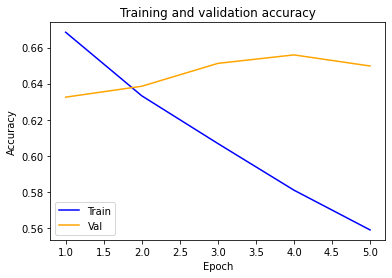

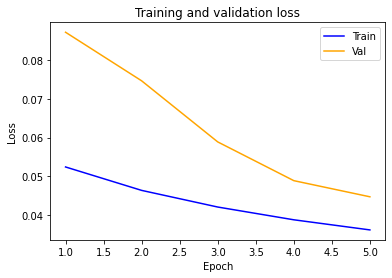

In [ ]:
def plot(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(1,len(acc)+1)

  plt.title('Training and validation accuracy')
  plt.plot(epochs, acc, color='blue', label='Train')
  plt.plot(epochs, val_acc, color='orange', label='Val')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()

  _ = plt.figure()
  plt.title('Training and validation loss')
  plt.plot(epochs, loss, color='blue', label='Train')
  plt.plot(epochs, val_loss, color='orange', label='Val')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  
plot(history)

In [ ]:
loss, acc = model.evaluate(test_ds)
print('Test Data Accuracy: ', acc)

48/48 [==============================] - 10s 213ms/step - loss: 0.2191 - accuracy: 0.7901
Test Data Accuracy:  0.7900793552398682


##### Prediction Visualization

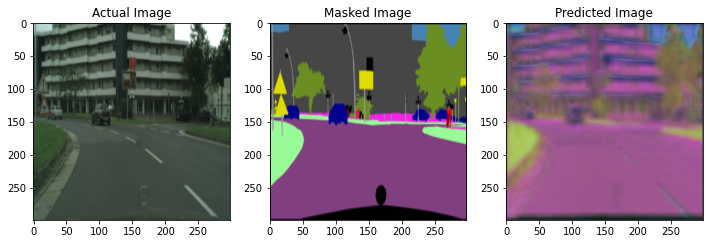

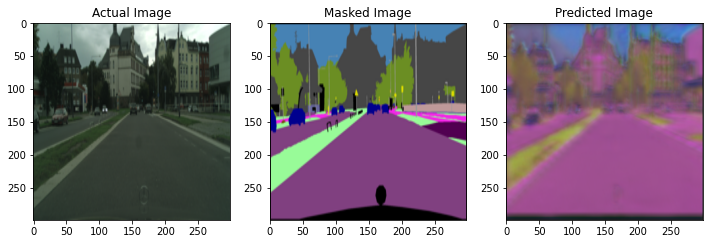

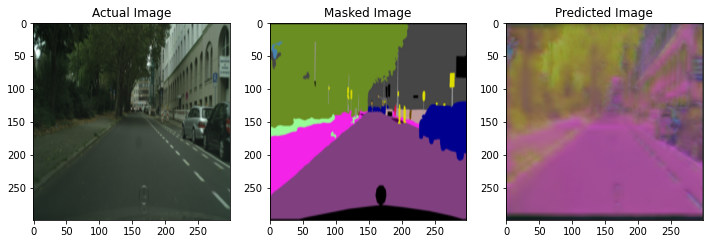

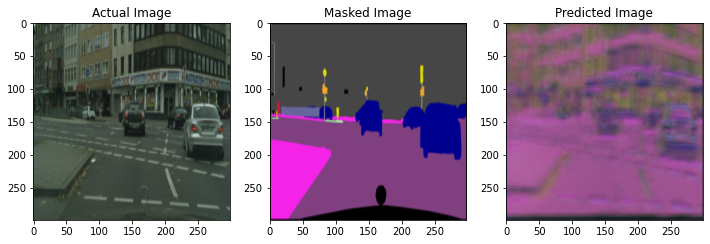

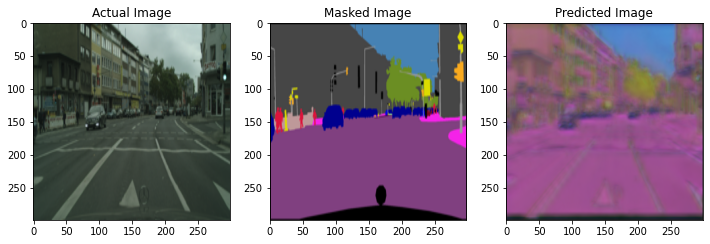

In [ ]:
pred_test_ds = model.predict(train_ds)

for img, gt, pred in list(zip(im_train_ds.take(5), gt_train_ds.take(5), pred_test_ds)):
    visualize_images(img, gt, pred)

#### **U-Net using K-Means Clustering**

**U-Net:** 
- This is a special kind of CNN, which uses **concatenate layers** to feed data from previous layers to the layers close to the output. 
- The network has a **double-funnel shape** to ensure that no data is lost
- The network has 9 million trainable parameters.


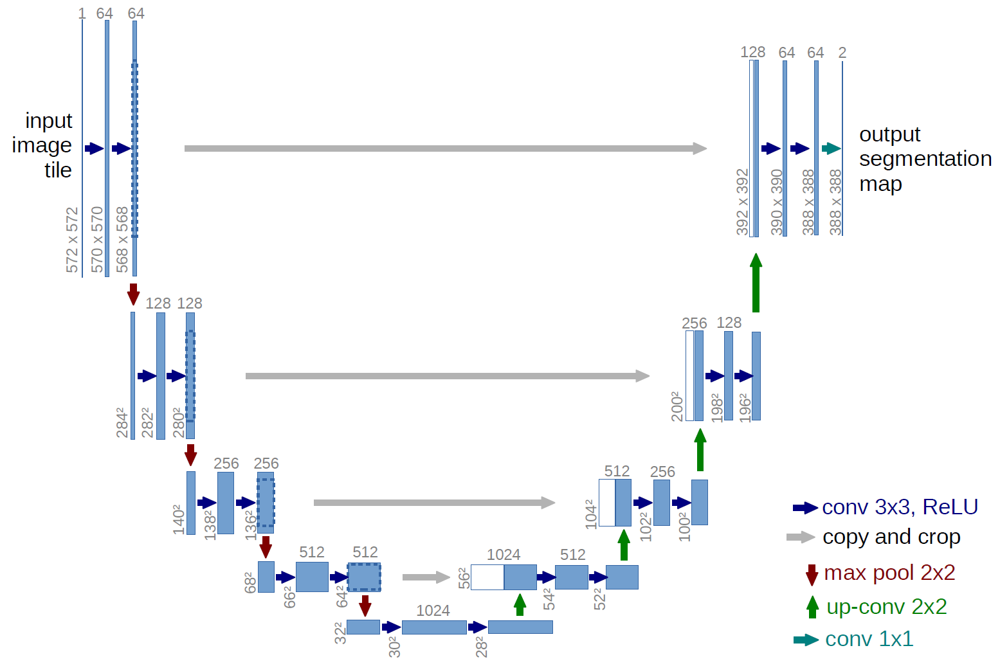

##### Color Clustering 

- Due to the compression of the JPEG standard, there are more than only a few discrete colors in the segmented image. 
- To find the **most imortant colors** and identify similar colors we can use KMeans clustering. 
- This also allows us to go from a color representation(3 channels) to a class representation (13 class).

In [ ]:
# normalize image pixels
IMG_SIZE1 =200
IMG_SIZE2 =256
BATCH_SIZE = 32
AUTOTUNE = tf.data.experimental.AUTOTUNE

GT_DIR = COLAB_DIR + 'gtFine/'
IMG_DIR = COLAB_DIR + 'leftImg/'
def load_and_preprocess_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_SIZE1, IMG_SIZE2])
    img /= 255.0
    return img

def get_image_paths(dir):
    return sorted([dir + path for path in listdir(dir)])

# data transformation using K-means
def LayersToRGBImage(img):
    colors = [(255,0,0), (0,255,0), (0,0,255), (255,255,0), (255,0,255), 
              (0,255,255), (255,255,255), (200,50,0),(50,200,0), (50,0,200), 
              (200,200,50), (0,50,200), (0,200,50), (0,0,0)]
    
    nimg = np.zeros((img.shape[0], img.shape[1], 3))
    for i in range(img.shape[2]):
        c = img[:,:,i]
        col = colors[i]
        
        for j in range(3):
            nimg[:,:,j]+=col[j]*c
    nimg = nimg/255.0
    return nimg
    
def train_kmeans(K=13):
    colors = []
    kmeans_gt_train_paths = [GT_DIR + 'train/' + path for path in listdir(GT_DIR + 'train/')[:20]]
    kmeans_gt_train_ds = tf.data.Dataset.from_tensor_slices(kmeans_gt_train_paths)
    kmeans_gt_train_ds = kmeans_gt_train_ds.map(load_and_preprocess_image, num_parallel_calls=AUTOTUNE)

    for seg in kmeans_gt_train_ds:
        colors.append(tf.reshape(seg, (seg.shape[0]*seg.shape[1], 3) ))
    colors = tf.concat(colors, 0) 
    print("Training K means on colors data of shape :",colors.shape)
    km = KMeans(K)
    km.fit(colors)
    print("\nK-means clustering trained\n", km)
    return km

# Traing a k-means classifier
km=train_kmeans(13)

def load_and_preprocess_segment(path):
    seg = load_and_preprocess_image(path)
    s = tf.reshape(seg, (seg.shape[0]*seg.shape[1],3))
    s = km.predict(s)
    s = tf.reshape(s, (seg.shape[0], seg.shape[1]))
    n = len(km.cluster_centers_)
    cls = np.zeros((seg.shape[0], seg.shape[1], n))
    for i in range(n):
        m = np.copy(s)
        m[m!=i] = 0
        m[m!=0] = 1
        cls[:,:,i]=m

    seg = tf.convert_to_tensor(cls, dtype=tf.float32)
    return seg

Training K means on colors data of shape : (1024000, 3)

K-means clustering trained
 KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=13, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)


In [ ]:
# train data
im_train_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(IMG_DIR+'train/'))
im_train_ds = im_train_ds.map(load_and_preprocess_image)

gt_train_paths = get_image_paths(GT_DIR+'train/')
gt_train_ds = map(load_and_preprocess_segment, gt_train_paths)
gt_train_ds = tf.data.Dataset.from_tensor_slices([a for a in gt_train_ds])
train_ds = tf.data.Dataset.zip((im_train_ds, gt_train_ds))
train_ds = train_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

print('Training Data:\n# of batches, Input batch shape, Ouput batch shape')
print(len(train_ds), next(iter(train_ds))[0].shape, next(iter(train_ds))[1].shape)

Training Data:
# of batches, Input batch shape, Ouput batch shape
93 (32, 200, 256, 3) (32, 200, 256, 13)


In [ ]:
# val data
im_val_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(IMG_DIR+'val/'))
im_val_ds = im_val_ds.map(load_and_preprocess_image)

gt_val_paths = get_image_paths(GT_DIR+'val/')
gt_val_ds = map(load_and_preprocess_segment, gt_val_paths)
gt_val_ds = tf.data.Dataset.from_tensor_slices([a for a in gt_val_ds])
val_ds = tf.data.Dataset.zip((im_val_ds, gt_val_ds))
val_ds = val_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)


print('Validation Data:\n# of batches, Input batch shape, Ouput batch shape')
print(len(val_ds), next(iter(val_ds))[0].shape, next(iter(val_ds))[1].shape)

Validation Data:
# of batches, Input batch shape, Ouput batch shape
16 (32, 200, 256, 3) (32, 200, 256, 13)


In [ ]:
# test data
im_test_ds = tf.data.Dataset.from_tensor_slices(get_image_paths(IMG_DIR+'test/'))
im_test_ds = im_test_ds.map(load_and_preprocess_image)

gt_test_paths = get_image_paths(GT_DIR+'test/')
gt_test_ds = map(load_and_preprocess_segment, gt_test_paths)
gt_test_ds = tf.data.Dataset.from_tensor_slices([a for a in gt_test_ds])
test_ds = tf.data.Dataset.zip((im_test_ds, gt_test_ds))
test_ds = test_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

print('Testing Data:\n# of batches, Input batch shape, Ouput batch shape')
print(len(test_ds), next(iter(test_ds))[0].shape, next(iter(test_ds))[1].shape)

Testing Data:
# of batches, Input batch shape, Ouput batch shape
48 (32, 200, 256, 3) (32, 200, 256, 13)


##### Model Definition

In [ ]:
def create_model():
    inp = Input(shape=(200, 256, 3))

    x1 = BatchNormalization()(inp)
    x1 = Conv2D(64, 12, activation="relu", padding="same")(x1)
    x1 = Conv2D(128, 12, activation="relu", padding="same")(x1)
    p1 = MaxPooling2D()(x1)
    #p1 = Dropout(0.2)(p1)

    #x2 = BatchNormalization()(x1)
    x2 = Conv2D(128, 9, activation="relu", padding="same")(p1)
    x2 = Conv2D(128, 9, activation="relu", padding="same")(x2)
    p2 = MaxPooling2D()(x2)
    #p2 = Dropout(0.2)(p2)

    #x3 = BatchNormalization()(x2)
    x3 = Conv2D(128, 6, activation="relu", padding="same")(p2)
    x3 = Conv2D(128, 6, activation="relu", padding="same")(x3)
    p3 = MaxPooling2D()(x3)
    #p3 = Dropout(0.2)(p3)

    #x4 = BatchNormalization()(x3)
    x4 = Conv2D(128, 3, activation="relu", padding="same")(p3)
    x4 = Conv2D(128, 3, activation="relu", padding="same")(x4)
    #x4 = MaxPooling2D()(x4)
    #x4 = Dropout(0.2)(x4)

    x5 = UpSampling2D()(x4)
    x5 = concatenate([x3, x5])
    x5 = Conv2D(128, 6, activation="relu", padding="same")(x5)
    x5 = Conv2D(128, 6, activation="relu", padding="same")(x5)
    #x5 = Dropout(0.2)(x5)

    x6 = UpSampling2D()(x5)
    x6 = concatenate([x2, x6])
    x6 = Conv2D(128, 6, activation="relu", padding="same")(x6)
    x6 = Conv2D(128, 6, activation="relu", padding="same")(x6)
    #x6 = Dropout(0.2)(x6)

    x7 = UpSampling2D()(x6)
    x7 = concatenate([x1, x7])
    x7 = Conv2D(13, 6, activation="relu", padding="same")(x7)
    x7 = Conv2D(13, 6, activation="softmax", padding="same")(x7)


    model = Model(inp, x7)

    opt = Adam(lr=0.0001)
    model.compile(optimizer=opt,
                loss="categorical_crossentropy",
                metrics=["accuracy"])
    return model

print("UNet Model Summary:\n")
model.summary()

UNet Model Summary:

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 200, 256, 3) 0                                            
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 200, 256, 3)  12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 200, 256, 64) 27712       batch_normalization[0][0]        
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 200, 256, 128 1179776     conv2d[0][0]                     
__________________________________________________________________

##### Model Training & Evaluation

In [ ]:
# loading trained model
checkpoint_path_old = drive_root+'cpt_12dec/cp.ckpt'
checkpoint_dir_old = os.path.dirname(checkpoint_path_old)
# load model
model = create_model()
model.load_weights(checkpoint_path_old)
# Re-evaluate loaded model
loss, acc = model.evaluate(val_ds, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

16/16 - 121s - loss: 2.3459 - accuracy: 0.1305
Restored model, accuracy: 13.05%


In [ ]:
# retrain model
checkpoint_path = drive_root+'cpt_15dec/cp.ckpt'
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

# Train the model with the new callback
model.fit(train_ds, epochs=2, validation_data=val_ds, verbose=1,
          callbacks=[cp_callback]) 

model.save(drive_root+'trained_model_15dec.h5')

loss, acc = model.evaluate(val_ds, verbose=2)
print("Retrained model, accuracy: {:5.2f}%".format(100 * acc))

Epoch 1/2
93/93 [==============================] - ETA: 0s - loss: 1.2007 - accuracy: 0.3015  
Epoch 00001: saving model to /gdrive/My Drive/Fall2020/ADL_Final/cpt_15dec/cp.ckpt
93/93 [==============================] - 6311s 68s/step - loss: 1.2007 - accuracy: 0.3015 - val_loss: 1.1798 - val_accuracy: 0.2975
Epoch 2/2
93/93 [==============================] - ETA: 0s - loss: 0.8853 - accuracy: 0.4015  
Epoch 00002: saving model to /gdrive/My Drive/Fall2020/ADL_Final/cpt_15dec/cp.ckpt
93/93 [==============================] - 6700s 72s/step - loss: 0.8853 - accuracy: 0.4015 - val_loss: 0.8492 - val_accuracy: 0.4084
16/16 - 126s - loss: 0.8492 - accuracy: 0.4084
Retrained model, accuracy: 40.84%


##### Prediction Visualization

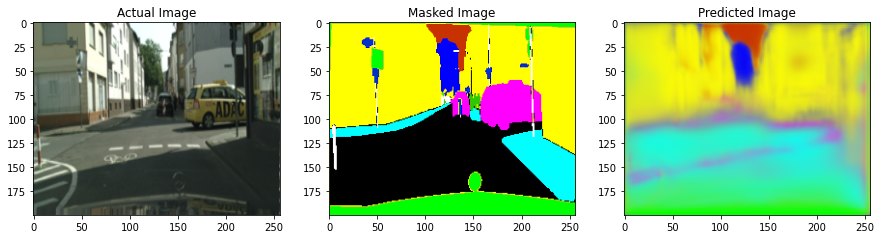

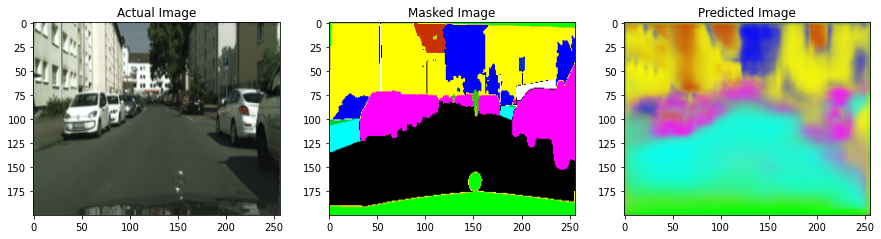

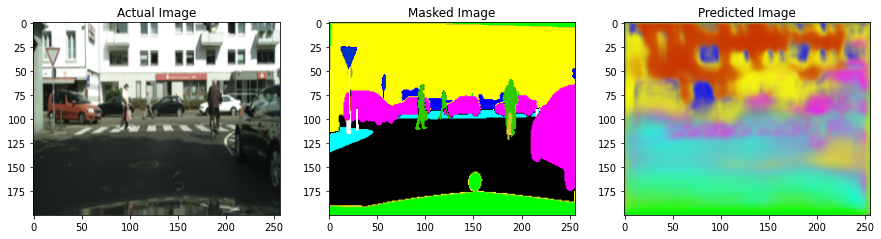

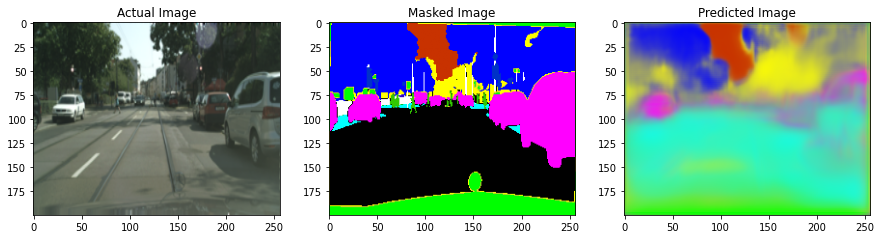

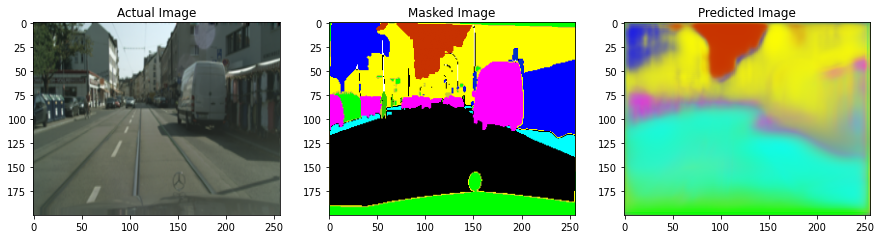

In [ ]:
max_show=4
for imgs, segs in val_ds:
    p = model.predict(imgs)
    for i in range(p.shape[0]):
        if i > max_show:
            break
        _p = LayersToRGBImage(p[i])
        _s = LayersToRGBImage(segs[i])
        predimg = _p
        trueimg = _s

        plt.figure(figsize=(15,5))
        plt.subplot(131)
        plt.title("Actual Image")
        plt.imshow(imgs[i])

        plt.subplot(132)
        plt.title("Masked Image")
        plt.imshow(_s)
        # plt.axis("off")

        plt.subplot(133)
        plt.title("Predicted Image")
        plt.imshow(_p)
        # plt.tight_layout()

        plt.show()
    break

**Key Takeaways:**
- Sidewalk colored skyblue and road colored black is mixed up in prediction and roads are also shown as sidewalk.
- Sky in red is learned well
- Trees in blue is learned decent
- Vehicles in pink are learned decent as well
- Buildings in yellow are larned well as this class is well represented in training images

### **4. Evaluation on Video**

*code to leverage the trained model to provide real-time segmented road scene prediction from video.*

In [ ]:
checkpoint_path = drive_root+'pspnet/cp.ckpt'
checkpoint_dir = os.path.dirname(checkpoint_path)

model.load_weights(checkpoint_path)

In [ ]:
vidcap = cv2.VideoCapture('road_video.mp4') # upload file
success, image = vidcap.read()
count = 0

# video to frames generation
while success:
    cv2.imwrite('orig_frame_%.3d.jpg' % count, image)  # save frame as JPEG file
    success, image = vidcap.read()
    count += 1

frames = [img for img in get_image_paths(COLAB_DIR) if img.endswith('.jpg')]

def convert_to_video(image_paths, video_name):
    frame = cv2.imread(image_paths[0])
    height, width, layers = frame.shape
    video = cv2.VideoWriter(video_name, 0, 30, (width,height))
    for image in image_paths:
        video.write(cv2.imread(image))
    
    cv2.destroyAllWindows()
    video.release()
  
# model predictions on generated frames
eval_ds = tf.data.Dataset.from_tensor_slices(frames)
eval_ds = eval_ds.map(load_and_preprocess_image)
eval_ds = eval_ds.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
convert_to_video(frames, 'original_video.avi')

pred_frames = model.predict(eval_ds)
count = 0
for image in pred_frames:
    plt.imsave('pred_frame_%.3d.png' % count, image)
    count += 1
# converting predictions to a video back
frames = [img for img in get_image_paths(COLAB_DIR) if img.endswith('.png')]
convert_to_video(frames, 'predicted_video.avi')

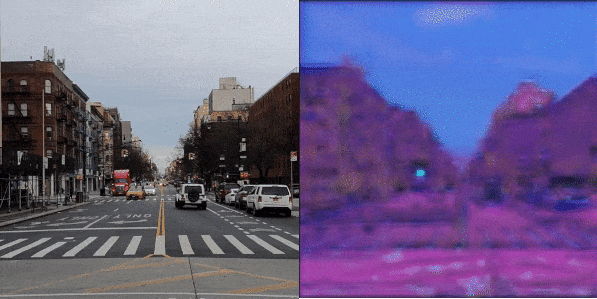

**Observations:**
- In the segmentation task, **light pink and dark pink** map to sidewalk and road respectively and light blue maps to sky. Our model is able to pick up on these segments as compared to some of the **more finer segments such as vehicles (dark blue) or people (red)**.

- The bicycles and the car at the end do show a hint of dark blue but the individuals on the cycle do not get picked up by the model.

- The model is trained on **road scenes which do not closely resemble the road scene video from a New York street** (as shown above). Due to GPU compute limitations, we were not able to train a more complex and deep model at higher image resolution to accurately capture the fine details.

- Most road scenes constitute majority of **sky, street and trees (green)** pixels. As a future work, we can look into boosting samples of the **minority classes** so that our model can learn and predict those subtleties better. This requires more computation but is possible using PSPNet and UNet.